#### 1.Import Library

In [1]:
import numpy as np
import torch
import pandas as pd
pd.set_option('display.max_rows', None)
import os
import random
import glob
import re
from torch import no_grad
from torch import tensor
from torch.nn import Softmax
from torch.optim import AdamW
from torch.utils.data import DataLoader
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from torch.cuda import is_available
import pytorch_lightning as pl
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, f1_score
import gc
import pickle
import sys
import psutil
MODEL_NAME = "bert-base-uncased"

D:\Anaconda3\envs\kaggle\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


#### 2. Import and Analysis Data

In [2]:
train_data = pd.read_csv('./data/train.csv',index_col='id')
train_data

,keyword,location,text,target
id,,,,
1,NaN,NaN,Our Deeds are the Reason of this #earthquake M...,1
4,NaN,NaN,Forest fire near La Ronge Sask. Canada,1
5,NaN,NaN,All residents asked to 'shelter in place' are ...,1
6,NaN,NaN,"13,000 people receive #wildfires evacuation or...",1
7,NaN,NaN,Just got sent this photo from Ruby #Alaska as ...,1
8,NaN,NaN,#RockyFire Update => California Hwy. 20 closed...,1
10,NaN,NaN,#flood #disaster Heavy rain causes flash flood...,1
13,NaN,NaN,I'm on top of the hill and I can see a fire in...,1
14,NaN,NaN,There's an emergency evacuation happening now ...,1


In [3]:
test_data = pd.read_csv('./data/test.csv',index_col='id')
test_data

,keyword,location,text
id,,,
0,NaN,NaN,Just happened a terrible car crash
2,NaN,NaN,"Heard about #earthquake is different cities, s..."
3,NaN,NaN,"there is a forest fire at spot pond, geese are..."
9,NaN,NaN,Apocalypse lighting. #Spokane #wildfires
11,NaN,NaN,Typhoon Soudelor kills 28 in China and Taiwan
12,NaN,NaN,We're shaking...It's an earthquake
21,NaN,NaN,They'd probably still show more life than Arse...
22,NaN,NaN,Hey! How are you?
27,NaN,NaN,What a nice hat?


In [4]:
# process useless info and concat data
for df in [train_data,test_data]:
    # replace url, user, number, blank, %20
    df['text'] = df['text'].apply(lambda x:re.sub(r'https?://[A-Za-z0-9/:.]+','*',x))
    df['text'] = df['text'].apply(lambda x:re.sub(r'@[A-Za-z0-9/:._]+','@user',x))
    df['text'] = df['text'].apply(lambda x:re.sub(r'[0-9]+','0',x))
    df['text'] = df['text'].apply(lambda x:re.sub(r'\s+',' ',x))
    df['keyword'] = df['keyword'].str.replace('%20','_')
    # text + '#' + keyword
    df['text'] = df['text'] + df['keyword'].apply(lambda x: ' #' + x if not(x is np.nan) else '' )

In [5]:
print(train_data['keyword'].nunique(),test_data['keyword'].nunique())

221 221


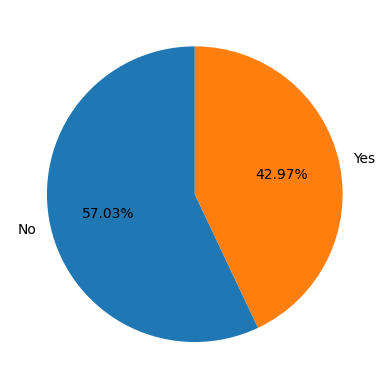

In [6]:
plt.pie(train_data['target'].value_counts(),labels=['No','Yes'],startangle=90,autopct='%.2f%%');

<AxesSubplot: xlabel='Count', ylabel='keyword'>

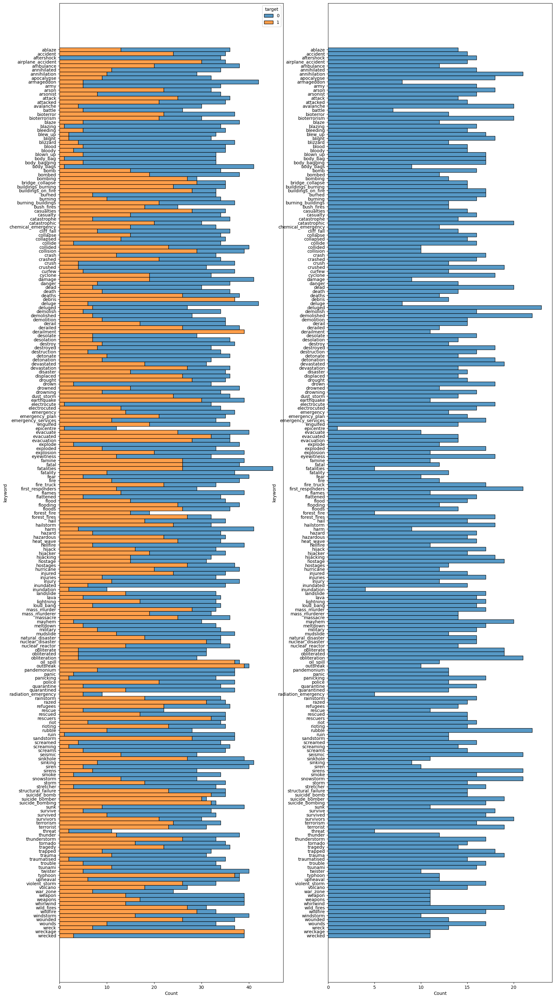

In [7]:
fig,ax=plt.subplots(1,2,figsize=(20,40))
sns.histplot(y=train_data['keyword'].sort_values(),hue=train_data['target'],multiple='stack',ax=ax[0])
sns.histplot(y=test_data['keyword'].sort_values(),ax=ax[1])

In [9]:
#load tokenizer
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME, use_fast=False)

In [10]:
max_length = 76
dataset_for_loader = []
for idx in train_data.index:
    # text encoding
    encoding = tokenizer(
        train_data.loc[idx,'text'],
        max_length=max_length,
        return_token_type_ids=False,
        padding='max_length',
        truncation=True
    )
    # label encoding
    encoding['labels'] = [float(1-train_data.loc[idx,'target']),float(train_data.loc[idx,'target'])]
    encoding = {k: tensor(v) for k, v in encoding.items()}
    dataset_for_loader.append(encoding)

In [11]:
dataset_for_loader

[{'input_ids': tensor([  101,  2256, 15616,  2024,  1996,  3114,  1997,  2023,  1001,  8372,
           2089, 16455,  9641,  2149,  2035,   102,     0,     0,     0,     0,
              0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
              0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
              0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
              0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
              0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
              0,     0,     0,     0,     0,     0]),
  'attention_mask': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0]),
  'labels': tensor([0., 1.])},
 {'input_ids': tensor([  101,  3224,  2543,  2379,  24

In [12]:
dataset_for_eval = []
for idx in test_data.index:
    encoding = tokenizer(
        test_data.loc[idx,'text'],
        max_length=max_length,
        return_token_type_ids=False,
        padding='max_length',
        truncation=True
    )
    encoding = {k: tensor(v) for k, v
                in encoding.items()}
    dataset_for_eval.append(encoding)

In [13]:
dataset_for_eval

[{'input_ids': tensor([ 101, 2074, 3047, 1037, 6659, 2482, 5823,  102,    0,    0,    0,    0,
             0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
             0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
             0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
             0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
             0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
             0,    0,    0,    0]),
  'attention_mask': tensor([1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0])},
 {'input_ids': tensor([ 101, 2657, 2055, 1001, 8372, 2003, 2367, 3655, 1010, 2994, 3647, 3071,
          1012,  102,    0,    0,    0,    0,    0,    0,    0,    0,    0,

In [14]:
ids_len = []
for data in dataset_for_loader:
    ids_len.append(sum(data['attention_mask']))
print(max(ids_len))

tensor(76)


#### 3. Model and Train

In [15]:
class BertForSequenceClassification_pl(pl.LightningModule):
    def  __init__(self, model_name, num_labels, lr):
        
        super().__init__()
        
        self.save_hyperparameters()
        
        self.bert_sc = AutoModelForSequenceClassification.from_pretrained(
            model_name,
        )

    def forward(self,x):
        output = self.bert_sc(**x)
        return output
        
    def training_step(self, batch, batch_idx):
        output = self(batch)
        loss = output.loss
#         loss.backward(retain_graph=True)
#         self.log('train_loss', loss)
        with no_grad():
            return loss
        
    def validation_step(self, batch, batch_idx):
        with no_grad():
            output = self(batch)
            loss = output.loss
            self.log('val_loss', loss)
            
    def predict_step(self, batch, batch_idx):
        with no_grad():
            output = self(batch)
            output = output.logits
            s = Softmax()
            output = s(output)
            return output

    def configure_optimizers(self):
        return AdamW(self.parameters(), lr=self.hparams.lr)

In [16]:
# Cross Validation
random.seed(0)
random.shuffle(dataset_for_loader)
random.seed(0)
dataset_idx = train_data.index.values
random.shuffle(dataset_idx)
n = len(dataset_for_loader)
n_train_start_1 = [0,int(1 / 3 * n),int(2 / 3 * n)]
n_train_end_1 = [int(1 / 3 * n),int(2 / 3 * n),n]
n_train_start_2 = [int(1 / 3 * n),int(2 / 3 * n),0]
n_train_end_2 = [int(2 / 3 * n),n,int(1 / 3 * n)]
n_val_start = [int(2 / 3 * n),0,int(1 / 3 * n)]
n_val_end = [n,int(1 / 3 * n),int(2 / 3 * n)]

In [17]:
accelerator = 'gpu' if is_available() else 'cpu'

In [18]:
accelerator

'gpu'

In [19]:
for i in range(3):
    dataset_train = dataset_for_loader[n_train_start_1[i]:n_train_end_1[i]] + dataset_for_loader[n_train_start_2[i]:n_train_end_2[i]]
    dataset_val = dataset_for_loader[n_val_start[i]:n_val_end[i]]
    

    dataloader_train = DataLoader(dataset_train, batch_size=64, num_workers=2, pin_memory=True, shuffle=True)
    dataloader_val = DataLoader(dataset_val,batch_size=64, num_workers=2, pin_memory=True)

    earlystopping = pl.callbacks.EarlyStopping(
        monitor='val_loss', 
        min_delta=0, 
        patience=0, 
        verbose=True, 
        mode='min', 
        strict=True, 
    )
    trainer = pl.Trainer(
        accelerator=accelerator,
        devices=1,
        max_epochs=10,
        callbacks=[earlystopping,],
        default_root_dir=f'./working/model_{i}'
    )


    model = BertForSequenceClassification_pl(model_name=MODEL_NAME, num_labels=2, lr=1e-5)
    trainer.fit(model=model,train_dataloaders=dataloader_train,val_dataloaders=dataloader_val)
    torch.save(model.to('cpu').state_dict(), f'checkpoint_model_{i}.pth')

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassific

Sanity Checking: 0it [00:00, ?it/s]

D:\Anaconda3\envs\kaggle\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


D:\Anaconda3\envs\kaggle\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Epoch 0:  67%|██████████████████████████████████                 | 80/120 [00:35<00:17,  2.24it/s, loss=0.432, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 0: 100%|██████████████████████████████████████████████████| 120/120 [00:43<00:00,  2.73it/s, loss=0.432, v_num=2]
                                                                                                                       

Metric val_loss improved. New best score: 0.424


Epoch 1:  67%|██████████████████████████████████                 | 80/120 [00:35<00:17,  2.24it/s, loss=0.358, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 1: 100%|██████████████████████████████████████████████████| 120/120 [00:43<00:00,  2.76it/s, loss=0.358, v_num=2]
                                                                                                                       

Metric val_loss improved by 0.028 >= min_delta = 0. New best score: 0.396


Epoch 2:  67%|██████████████████████████████████                 | 80/120 [00:35<00:17,  2.22it/s, loss=0.315, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 2: 100%|██████████████████████████████████████████████████| 120/120 [00:44<00:00,  2.73it/s, loss=0.315, v_num=2]
                                                                                                                       

Metric val_loss improved by 0.004 >= min_delta = 0. New best score: 0.392


Epoch 3:  67%|██████████████████████████████████                 | 80/120 [00:35<00:17,  2.24it/s, loss=0.305, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 3: 100%|██████████████████████████████████████████████████| 120/120 [00:43<00:00,  2.75it/s, loss=0.305, v_num=2]
                                                                                                                       

Monitored metric val_loss did not improve in the last 1 records. Best score: 0.392. Signaling Trainer to stop.


Epoch 3: 100%|██████████████████████████████████████████████████| 120/120 [00:59<00:00,  2.03it/s, loss=0.305, v_num=2]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassific

Epoch 0:  67%|██████████████████████████████████                 | 80/120 [00:35<00:17,  2.25it/s, loss=0.466, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 0: 100%|██████████████████████████████████████████████████| 120/120 [00:43<00:00,  2.76it/s, loss=0.466, v_num=2]
                                                                                                                       

Metric val_loss improved. New best score: 0.451


Epoch 1:  67%|██████████████████████████████████▋                 | 80/120 [00:36<00:18,  2.19it/s, loss=0.38, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 1: 100%|███████████████████████████████████████████████████| 120/120 [00:44<00:00,  2.71it/s, loss=0.38, v_num=2]
                                                                                                                       

Metric val_loss improved by 0.057 >= min_delta = 0. New best score: 0.394


Epoch 2:  67%|██████████████████████████████████                 | 80/120 [00:35<00:17,  2.23it/s, loss=0.321, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 2: 100%|██████████████████████████████████████████████████| 120/120 [00:43<00:00,  2.74it/s, loss=0.321, v_num=2]
                                                                                                                       

Monitored metric val_loss did not improve in the last 1 records. Best score: 0.394. Signaling Trainer to stop.


Epoch 2: 100%|██████████████████████████████████████████████████| 120/120 [00:58<00:00,  2.05it/s, loss=0.321, v_num=2]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassific

Epoch 0:  67%|██████████████████████████████████                 | 80/120 [00:36<00:18,  2.21it/s, loss=0.465, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 0: 100%|██████████████████████████████████████████████████| 120/120 [00:44<00:00,  2.72it/s, loss=0.465, v_num=2]
                                                                                                                       

Metric val_loss improved. New best score: 0.437


Epoch 1:  67%|██████████████████████████████████                 | 80/120 [00:36<00:18,  2.21it/s, loss=0.387, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 1: 100%|██████████████████████████████████████████████████| 120/120 [00:43<00:00,  2.74it/s, loss=0.387, v_num=2]
                                                                                                                       

Metric val_loss improved by 0.038 >= min_delta = 0. New best score: 0.399


Epoch 2:  67%|██████████████████████████████████                 | 80/120 [00:36<00:18,  2.21it/s, loss=0.334, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 2: 100%|██████████████████████████████████████████████████| 120/120 [00:43<00:00,  2.74it/s, loss=0.334, v_num=2]
                                                                                                                       

Metric val_loss improved by 0.011 >= min_delta = 0. New best score: 0.388


Epoch 3:  67%|██████████████████████████████████▋                 | 80/120 [00:35<00:17,  2.26it/s, loss=0.31, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 3: 100%|███████████████████████████████████████████████████| 120/120 [00:43<00:00,  2.78it/s, loss=0.31, v_num=2]
                                                                                                                       

Monitored metric val_loss did not improve in the last 1 records. Best score: 0.388. Signaling Trainer to stop.


Epoch 3: 100%|███████████████████████████████████████████████████| 120/120 [00:58<00:00,  2.06it/s, loss=0.31, v_num=2]


#### 4.Evaluation

In [20]:
df_pred = pd.DataFrame(index=test_data.index)
df_pred_proba = pd.DataFrame(index=test_data.index)
for i in range(3):
    dataloader_eval = DataLoader(dataset_for_eval,batch_size=128, num_workers=2, pin_memory=True)
    model = BertForSequenceClassification_pl(model_name=MODEL_NAME, num_labels=2, lr=1e-5)
    model.load_state_dict(torch.load(f'checkpoint_model_{i}.pth'))
    tensor_pred_eval = trainer.predict(model=model,dataloaders=dataloader_eval)
    np_pred_eval = np.concatenate([p for p in tensor_pred_eval])
    df_pred_proba.loc[:,i] = np_pred_eval[:,1]
#     pred_eval = (np_pred_eval[:,1]>=thresholds[i])*1
#     df_pred.loc[:,i] = pred_eval
df_pred_proba['mean'] = df_pred_proba.mean(axis=1)
df_pred['target'] = (df_pred_proba['mean']>=0.5).astype(int)
df_pred_proba.to_csv('./working/df_pred_proba.csv')


df_pred.to_csv('./working/df_pred.csv')

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

Predicting DataLoader 0:   4%|██▏                                                       | 1/26 [00:00<00:01, 13.15it/s]

C:\Users\XiN_Y\AppData\Local\Temp\ipykernel_4564\4063314461.py:35: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = s(output)


Predicting DataLoader 0: 100%|█████████████████████████████████████████████████████████| 26/26 [00:06<00:00,  3.96it/s]


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

Predicting DataLoader 0:   4%|██▏                                                       | 1/26 [00:00<00:00, 33.42it/s]

C:\Users\XiN_Y\AppData\Local\Temp\ipykernel_4564\4063314461.py:35: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = s(output)


Predicting DataLoader 0: 100%|█████████████████████████████████████████████████████████| 26/26 [00:06<00:00,  3.96it/s]


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

Predicting DataLoader 0:   4%|██▏                                                       | 1/26 [00:00<00:00, 32.34it/s]

C:\Users\XiN_Y\AppData\Local\Temp\ipykernel_4564\4063314461.py:35: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = s(output)


Predicting DataLoader 0: 100%|█████████████████████████████████████████████████████████| 26/26 [00:06<00:00,  3.95it/s]


In [21]:
# df_pred['target'] = (df_pred.mean(axis=1)>=0.5).astype(int)
# df_pred=df_pred[['target']]
df_pred=df_pred.sort_index()
df_pred=df_pred.reset_index(drop=False)
df_pred.columns=['id','target']

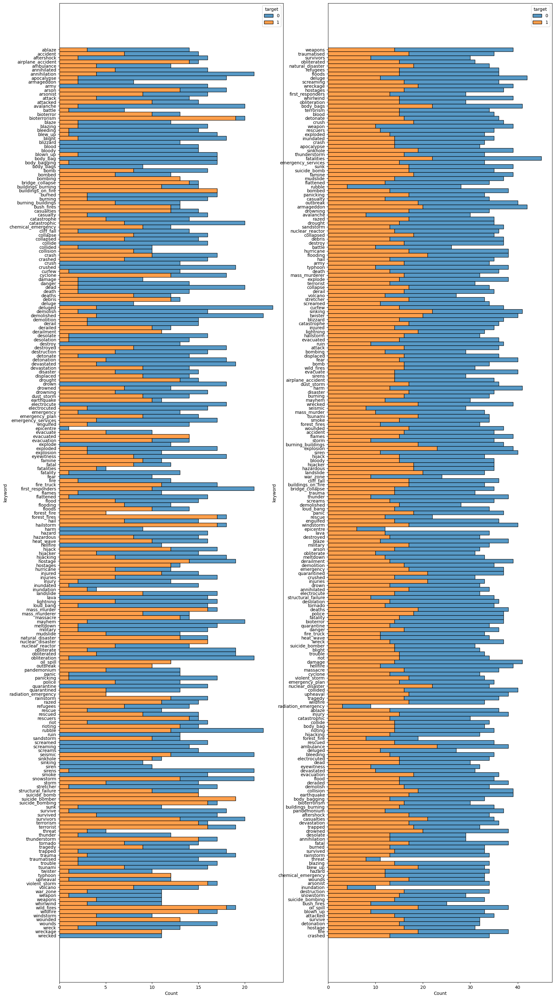

In [22]:
test_data_plot = test_data.merge(df_pred,left_index=True,right_on='id')
fig,ax=plt.subplots(1,2,figsize=(20,40))
sns.histplot(y=train_data['keyword'].sort_values(),hue=train_data['target'],multiple='stack',ax=ax[1])
sns.histplot(y=test_data_plot['keyword'].sort_values(),hue=test_data_plot['target'],multiple='stack',ax=ax[0]);

In [23]:
# special process
# 0
index_aftershock = test_data_plot[test_data_plot['keyword'] == 'aftershock'].index
# 1
index_debris = test_data_plot[test_data_plot['keyword'] == 'debris'].index
index_derailment = test_data_plot[test_data_plot['keyword'] == 'derailment'].index
index_wreckage = test_data_plot[test_data_plot['keyword'] == 'wreckage'].index

In [24]:
df_pred.loc[index_debris]['target']=1

In [25]:
df_pred.loc[index_aftershock]['target']=0

In [26]:
df_pred.to_csv('./working/submission.csv',index=None,header=True)

In [27]:
train_data

,keyword,location,text,target
id,,,,
4351,NaN,NaN,Our Deeds are the Reason of this #earthquake M...,1
209,NaN,NaN,Forest fire near La Ronge Sask. Canada,1
9490,NaN,NaN,All residents asked to 'shelter in place' are ...,1
3609,NaN,NaN,"0,0 people receive #wildfires evacuation order...",1
3643,NaN,NaN,Just got sent this photo from Ruby #Alaska as ...,1
2250,NaN,NaN,#RockyFire Update => California Hwy. 0 closed ...,1
5208,NaN,NaN,#flood #disaster Heavy rain causes flash flood...,1
10541,NaN,NaN,I'm on top of the hill and I can see a fire in...,1
7937,NaN,NaN,There's an emergency evacuation happening now ...,1
